In [1]:
#import libraries

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt 
plt.style.use("ggplot")
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams["figure.figsize"] = (12,8)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


### Movies Correlation

Find what fields are correlated with the gross revenue. 

In [3]:
df = pd.read_csv("movies.csv")
df.head(5)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7591 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    5497 non-null   float64
 12  gross     7479 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


budget and gross is a float due to how its framed. For example, 39846344.0 can just be 39846344. We will edit it later on once we resolve any missing values.

### Check missing values

In [7]:
## Check missing data

df.isnull().sum()

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

The columns do have missing values, I will fill those columns using mean.

In [9]:
# Fill numeric columns with the mean
numeric_cols = df.select_dtypes(include='number').columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())

# Fill non-numeric columns with the mode
non_numeric_cols = df.select_dtypes(exclude='number').columns
df[non_numeric_cols] = df[non_numeric_cols].apply(lambda x: x.fillna(x.mode()[0]))

In [10]:
df.isnull().sum()

name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     0
budget      0
gross       0
company     0
runtime     0
dtype: int64

### Edit Data types

In [12]:
#change budget and gross to integer 

df['budget'] = df['budget'].astype('int64')

df['gross'] = df['gross'].astype('int64')

In [13]:
#check the results

df.head(5)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


#### check movies by gross in ascending order

In [36]:
df = df.sort_values(by = ['gross'], inplace = False, ascending = False)

In [16]:
pd.set_option("display.max_rows", None)

In [28]:
df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.400000,9.270000e+05,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.000000
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.800000,6.500000e+04,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.000000
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.700000,1.200000e+06,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.000000
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.700000,2.210000e+05,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.000000
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.300000,1.080000e+05,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.000000
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.400000,1.230000e+05,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.000000
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.900000,1.880000e+05,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.000000
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.200000,3.300000e+05,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.000000
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.800000,1.010000e+05,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.000000
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.000000,1.000000e+04,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.000000


## See which columns are most correlated to gross revenue by visualization

My prediction is that budget would have high correlation. Perhaps, company that is more popular and succesfull such as disney or fox

<function matplotlib.pyplot.show(close=None, block=None)>

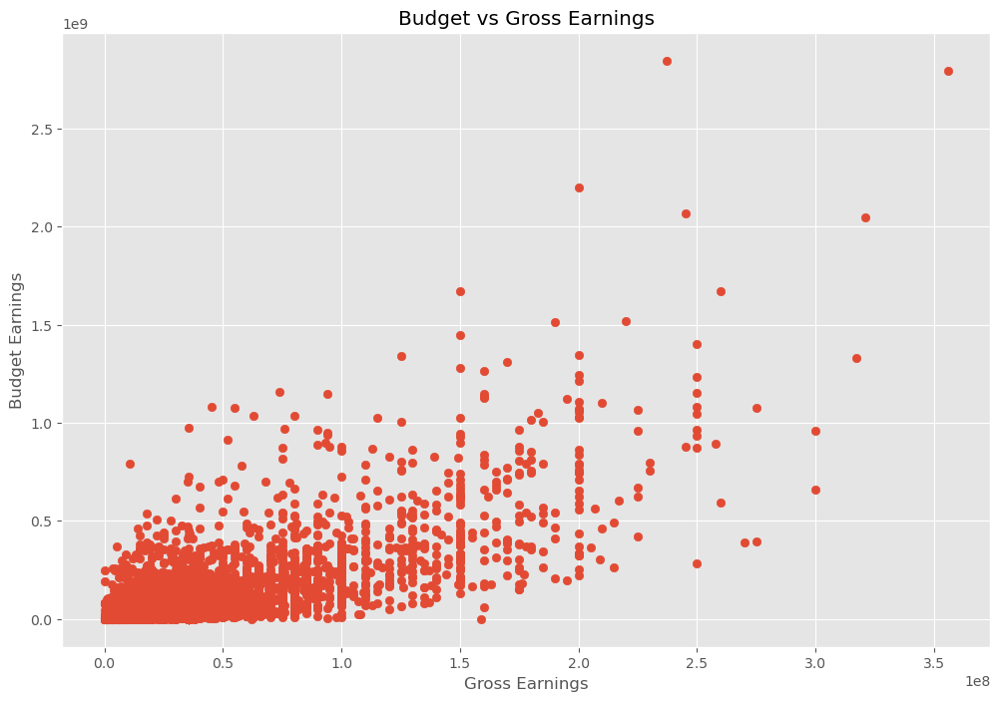

In [40]:
# check by doing a scatterplot with budget vs. gross revenue

plt.scatter(x = df['budget'],y = df['gross'])
plt.title("Budget vs Gross Earnings")
plt.xlabel('Gross Earnings')
plt.ylabel("Budget Earnings")
plt.show

<AxesSubplot:xlabel='budget', ylabel='gross'>

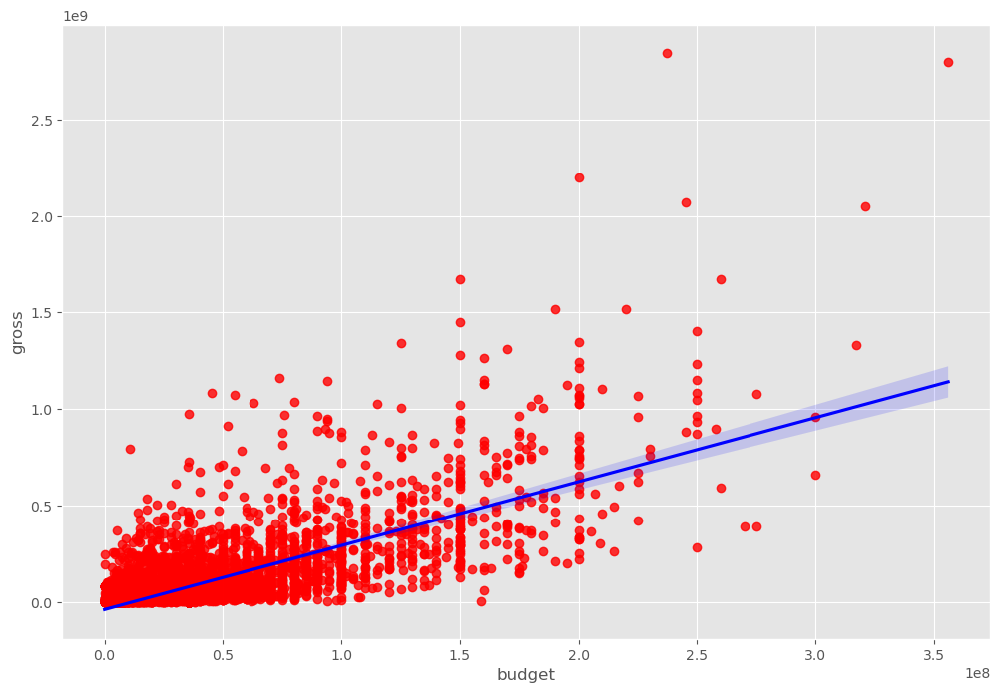

In [44]:
# Regression plot using the same features

sns.regplot(x="budget", y= "gross", data = df, scatter_kws={"color": "red"}, line_kws={"color":"blue"})

In [50]:
# Determine the actual correlation

df.corr(method= "pearson")

,year,score,votes,budget,gross,runtime
year,1.000000,0.097936,0.222810,0.265578,0.252042,0.120766
score,0.097936,1.000000,0.409182,0.064541,0.182868,0.399329
votes,0.222810,0.409182,1.000000,0.421007,0.628713,0.309166
budget,0.265578,0.064541,0.421007,1.000000,0.711270,0.265287
gross,0.252042,0.182868,0.628713,0.711270,1.000000,0.241335
runtime,0.120766,0.399329,0.309166,0.265287,0.241335,1.000000


High Correlation between budget and gross.

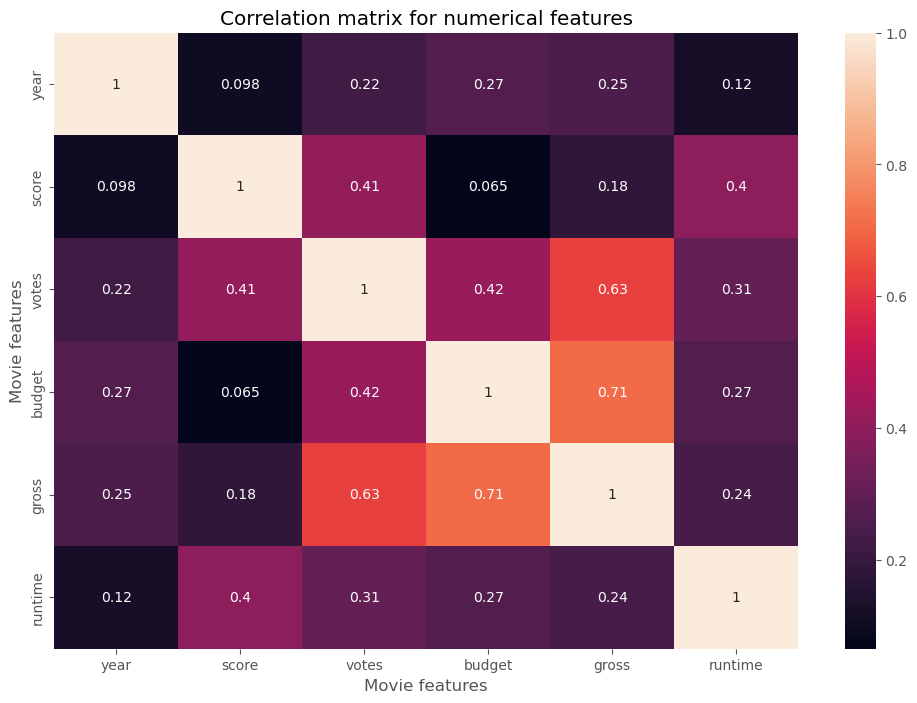

In [57]:
# Visualize correlation matrix

correlation_matrix = df.corr(method= "pearson")

sns.heatmap(correlation_matrix, annot = True)
plt.title("Correlation matrix for numerical features")
plt.xlabel('Movie features')
plt.ylabel("Movie features")
plt.show()

### Look at company feature, company is not numeric. Lets give them each a unique identifier. 

In [63]:
df_numer = df

#use for loop
for col_name in df_numer.columns:
    if(df_numer[col_name].dtype == "object"):
        df_numer[col_name]= df_numer[col_name].astype("category")
        df_numer[col_name]= df_numer[col_name].cat.codes  

df_numer
                                                

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,5,0,2009,696,7.800000,1.100000e+06,1155,1778,2334,55,237000000,2847246203,2253,162.000000
7445,Avengers: Endgame,5,0,2019,183,8.400000,9.030000e+05,162,743,2241,55,356000000,2797501328,1606,181.000000
3045,Titanic,5,6,1997,704,7.800000,1.100000e+06,1155,1778,1595,55,200000000,2201647264,2253,194.000000
6663,Star Wars: Episode VII - The Force Awakens,5,0,2015,698,7.800000,8.760000e+05,1125,2550,524,55,245000000,2069521700,1540,138.000000
7244,Avengers: Infinity War,5,0,2018,192,8.400000,8.970000e+05,162,743,2241,55,321000000,2048359754,1606,149.000000
7480,The Lion King,4,2,2019,1488,6.900000,2.220000e+05,1455,1919,676,55,260000000,1670727580,2316,118.000000
6653,Jurassic World,5,0,2015,1704,7.000000,5.930000e+05,517,3568,437,55,150000000,1670516444,2281,124.000000
6043,The Avengers,5,0,2012,2472,8.000000,1.300000e+06,1517,2314,2241,55,220000000,1518815515,1606,143.000000
6646,Furious 7,5,0,2015,221,7.100000,3.700000e+05,1189,706,2721,55,190000000,1515341399,2281,137.000000
7494,Frozen II,4,2,2019,2676,6.800000,1.480000e+05,432,1950,1527,55,150000000,1450026933,2315,103.000000


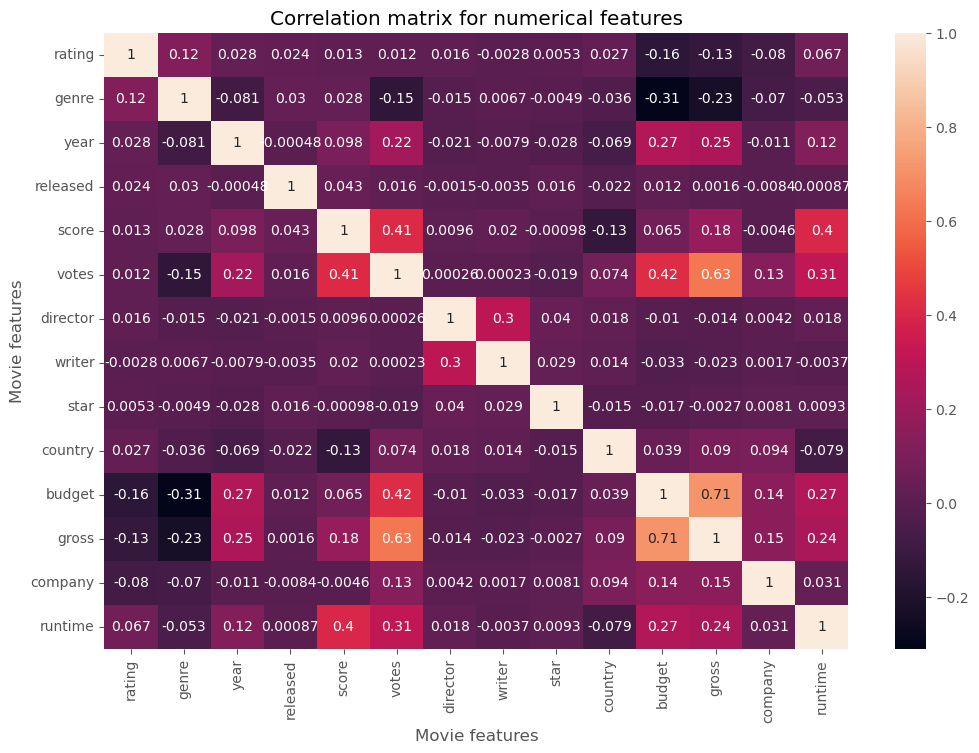

In [67]:
correlation_matrix = df_numer.corr(method= "pearson")

sns.heatmap(correlation_matrix, annot = True)
plt.title("Correlation matrix for numerical features")
plt.xlabel('Movie features')
plt.ylabel("Movie features")
plt.show()

company has a small part in gross revenue. Budget is strongly correlated.

### Filter it down to understand it even better

In [71]:
df_numer.corr()

,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
rating,1.000000,0.123465,0.027931,0.023643,0.013246,0.012378,0.016255,-0.002795,0.005314,0.026930,-0.156544,-0.130083,-0.079626,0.066641
genre,0.123465,1.000000,-0.081261,0.029997,0.027959,-0.145276,-0.015258,0.006746,-0.004856,-0.035896,-0.310566,-0.230267,-0.070013,-0.052699
year,0.027931,-0.081261,1.000000,-0.000484,0.097936,0.222810,-0.020795,-0.007901,-0.027745,-0.069423,0.265578,0.252042,-0.011438,0.120766
released,0.023643,0.029997,-0.000484,1.000000,0.042617,0.016114,-0.001492,-0.003461,0.015550,-0.022042,0.012267,0.001637,-0.008443,0.000867
score,0.013246,0.027959,0.097936,0.042617,1.000000,0.409182,0.009559,0.019795,-0.000979,-0.134577,0.064541,0.182868,-0.004594,0.399329
votes,0.012378,-0.145276,0.222810,0.016114,0.409182,1.000000,0.000260,0.000232,-0.019452,0.073582,0.421007,0.628713,0.130638,0.309166
director,0.016255,-0.015258,-0.020795,-0.001492,0.009559,0.000260,1.000000,0.299512,0.039715,0.017926,-0.010364,-0.014272,0.004250,0.017624
writer,-0.002795,0.006746,-0.007901,-0.003461,0.019795,0.000232,0.299512,1.000000,0.028745,0.014409,-0.033217,-0.023186,0.001665,-0.003698
star,0.005314,-0.004856,-0.027745,0.015550,-0.000979,-0.019452,0.039715,0.028745,1.000000,-0.014749,-0.016952,-0.002683,0.008072,0.009273
country,0.026930,-0.035896,-0.069423,-0.022042,-0.134577,0.073582,0.017926,0.014409,-0.014749,1.000000,0.038620,0.089905,0.094210,-0.079265


In [73]:
# use unstacking to see correlatioon

correlation_mat = df_numer.corr()
corr_pairs = correlation_mat.unstack()

corr_pairs

rating    rating      1.000000
          genre       0.123465
          year        0.027931
          released    0.023643
          score       0.013246
          votes       0.012378
          director    0.016255
          writer     -0.002795
          star        0.005314
          country     0.026930
          budget     -0.156544
          gross      -0.130083
          company    -0.079626
          runtime     0.066641
genre     rating      0.123465
          genre       1.000000
          year       -0.081261
          released    0.029997
          score       0.027959
          votes      -0.145276
          director   -0.015258
          writer      0.006746
          star       -0.004856
          country    -0.035896
          budget     -0.310566
          gross      -0.230267
          company    -0.070013
          runtime    -0.052699
year      rating      0.027931
          genre      -0.081261
          year        1.000000
          released   -0.000484
        

In [75]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre     budget     -0.310566
budget    genre      -0.310566
gross     genre      -0.230267
genre     gross      -0.230267
budget    rating     -0.156544
rating    budget     -0.156544
genre     votes      -0.145276
votes     genre      -0.145276
score     country    -0.134577
country   score      -0.134577
gross     rating     -0.130083
rating    gross      -0.130083
genre     year       -0.081261
year      genre      -0.081261
company   rating     -0.079626
rating    company    -0.079626
runtime   country    -0.079265
country   runtime    -0.079265
company   genre      -0.070013
genre     company    -0.070013
year      country    -0.069423
country   year       -0.069423
runtime   genre      -0.052699
genre     runtime    -0.052699
country   genre      -0.035896
genre     country    -0.035896
budget    writer     -0.033217
writer    budget     -0.033217
star      year       -0.027745
year      star       -0.027745
writer    gross      -0.023186
gross     writer     -0.023186
released

In [77]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]

high_corr

gross     votes       0.628713
votes     gross       0.628713
budget    gross       0.711270
gross     budget      0.711270
rating    rating      1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
director  director    1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

## At the end..

Votes and budget have the highest correlation to gross and earnings. Company has low correlation